In [1]:
#Importar librerias necesarias
from funpymodeling.exploratory import freq_tbl
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.special as special
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score



In [2]:
#Carga desde un archivo .csv sin indice y eliminar filas innecesarias
mexicolol=pd.read_csv("listingssi.csv")
mexicolol.head(2)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,898633,https://www.airbnb.com/rooms/898633,20240627045222,2024-06-28,city scrape,City SkyLine View from 1 Bedroom Apt in CDMX,The LOCATION is undoubtedly THE BIG advantage ...,The hipster Roma neighborhood embodies a color...,https://a0.muscache.com/pictures/ba75b1c1-cb02...,4796027,...,4.96,4.93,4.91,NaN,f,3,2,1,0,0.41
1,35797,https://www.airbnb.com/rooms/35797,20240627045222,2024-06-27,city scrape,Villa Dante,"Dentro de Villa un estudio de arte con futon, ...","Santa Fe Mall, Interloma Park and the Lion Des...",https://a0.muscache.com/pictures/f395ab78-1185...,153786,...,NaN,NaN,NaN,NaN,f,1,1,0,0,NaN


In [3]:
mexicolol.dtypes

id                                                int64
listing_url                                      object
scrape_id                                         int64
last_scraped                                     object
source                                           object
                                                 ...   
calculated_host_listings_count                    int64
calculated_host_listings_count_entire_homes       int64
calculated_host_listings_count_private_rooms      int64
calculated_host_listings_count_shared_rooms       int64
reviews_per_month                               float64
Length: 75, dtype: object

In [4]:
#Reemplazamos valores nulos del dataframe con "ffill"
mexico11 =mexicolol.fillna(method="ffill")
mexico11 =mexicolol.fillna(method="bfill")


/var/folders/6c/rr21_80s11n3cvrghbnb5mz00000gn/T/ipykernel_3919/3860403459.py:2: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  mexico11 =mexicolol.fillna(method="ffill")
/var/folders/6c/rr21_80s11n3cvrghbnb5mz00000gn/T/ipykernel_3919/3860403459.py:3: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  mexico11 =mexicolol.fillna(method="bfill")


In [5]:
#Corroboramos valores nulos del dataframe
mexiconulo1=mexico11.isnull().sum()
mexiconulo1

id                                               0
listing_url                                      0
scrape_id                                        0
last_scraped                                     0
source                                           0
                                                ..
calculated_host_listings_count                   0
calculated_host_listings_count_entire_homes      0
calculated_host_listings_count_private_rooms     0
calculated_host_listings_count_shared_rooms      0
reviews_per_month                               54
Length: 75, dtype: int64

In [6]:
#Como no funciono el bfill y ffill usamos el metodo de sustituir por una palabra 
mexicolimpio1=mexico11.fillna('nodato')
mexicolimpio1.info()
mexicolimpio1.isnull().sum().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26536 entries, 0 to 26535
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            26536 non-null  int64  
 1   listing_url                                   26536 non-null  object 
 2   scrape_id                                     26536 non-null  int64  
 3   last_scraped                                  26536 non-null  object 
 4   source                                        26536 non-null  object 
 5   name                                          26536 non-null  object 
 6   description                                   26536 non-null  object 
 7   neighborhood_overview                         26536 non-null  object 
 8   picture_url                                   26536 non-null  object 
 9   host_id                                       26536 non-null 

0

In [7]:
mexicolimpio1.isnull().sum().sum()

0

In [8]:
#Reemplazamos el % en la columna host_acceptance_rate para que se vuelva numerica
mexicolimpio1['host_acceptance_rate'] = mexicolimpio1['host_acceptance_rate'].str.replace('%', '', regex=False)
mexicolimpio1['host_acceptance_rate'] = pd.to_numeric(mexicolimpio1['host_acceptance_rate'])


In [9]:
#Reemplazamos el $ en la columna host_response_rate para que se vuelva numerica
mexicolimpio1['host_response_rate'] = mexicolimpio1['host_response_rate'].str.replace('%', '', regex=False)
mexicolimpio1['host_response_rate'] = pd.to_numeric(mexicolimpio1['host_response_rate'])

In [10]:
#Reemplazamos el % en la columna price para que se vuelva numerica
mexicolimpio1['price'] = mexicolimpio1['price'].str.replace('$', '', regex=False)
mexicolimpio1['price'] = mexicolimpio1['price'].str.replace(',', '', regex=False)
mexicolimpio1['price'] = pd.to_numeric(mexicolimpio1['price'])

In [11]:
mexicolimpio1.drop("amenities",axis=1)
mexicolimpio1.head(2)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,898633,https://www.airbnb.com/rooms/898633,20240627045222,2024-06-28,city scrape,City SkyLine View from 1 Bedroom Apt in CDMX,The LOCATION is undoubtedly THE BIG advantage ...,The hipster Roma neighborhood embodies a color...,https://a0.muscache.com/pictures/ba75b1c1-cb02...,4796027,...,4.96,4.93,4.91,nodato,f,3,2,1,0,0.41
1,35797,https://www.airbnb.com/rooms/35797,20240627045222,2024-06-27,city scrape,Villa Dante,"Dentro de Villa un estudio de arte con futon, ...","Santa Fe Mall, Interloma Park and the Lion Des...",https://a0.muscache.com/pictures/f395ab78-1185...,153786,...,4.78,4.98,4.48,nodato,f,1,1,0,0,0.42


In [12]:
mexicolimpio1.isnull().sum().sum()

0

In [13]:
#Graficamos todas las dispersiones entre todas las variables
sns.pairplot(mexicolimpio1)

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/seaborn/_ol

price 

In [75]:
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= mexicolimpio1[['price']]
Var_Dep= mexicolimpio1['beds']
#Redefinimos las variables 
x= Vars_Indep
y= Var_Dep

función inversa 

In [76]:
def  func1 (x, a, b, c):
     return 1/a*x

In [77]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, mexicolimpio1['price'], mexicolimpio1['beds'])

/var/folders/6c/rr21_80s11n3cvrghbnb5mz00000gn/T/ipykernel_3919/3635341877.py:2: OptimizeWarning: Covariance of the parameters could not be estimated
  parametros, covs= curve_fit(func1, mexicolimpio1['price'], mexicolimpio1['beds'])


In [78]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([5.20733784e+03, 1.00000000e+00, 1.00000000e+00])

In [79]:
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, mexicolimpio1['price'], mexicolimpio1['beds'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = 1/a*x
yfit1

/var/folders/6c/rr21_80s11n3cvrghbnb5mz00000gn/T/ipykernel_3919/2665319862.py:2: OptimizeWarning: Covariance of the parameters could not be estimated
  parametros, _ = curve_fit(func1, mexicolimpio1['price'], mexicolimpio1['beds'])


,price
0,0.317245
1,0.703430
2,3.456661
3,0.156318
4,0.369287
...,...
26531,1.507488
26532,0.283830
26533,0.179746
26534,0.147484


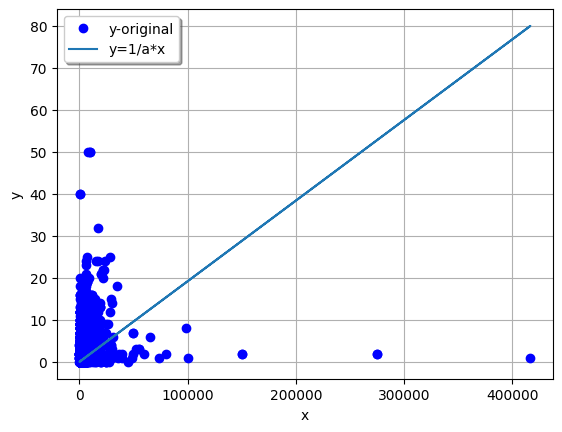

In [80]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=1/a*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [82]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

-0.9024427627987959

no fue un modelo adecuado ya que la r2 salio 0 

funcion cuadratica inversa 

In [83]:
def  func1 (x, a, b, c):
     return 1/a*x**2

In [84]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, mexicolimpio1['price'], mexicolimpio1['beds'])
parametros

/var/folders/6c/rr21_80s11n3cvrghbnb5mz00000gn/T/ipykernel_3919/1999142449.py:2: OptimizeWarning: Covariance of the parameters could not be estimated
  parametros, covs= curve_fit(func1, mexicolimpio1['price'], mexicolimpio1['beds'])


array([2.94633692e+10, 1.00000000e+00, 1.00000000e+00])

In [85]:
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, mexicolimpio1['price'], mexicolimpio1['beds'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = 1/a*x**2
yfit1

/var/folders/6c/rr21_80s11n3cvrghbnb5mz00000gn/T/ipykernel_3919/2878188455.py:2: OptimizeWarning: Covariance of the parameters could not be estimated
  parametros, _ = curve_fit(func1, mexicolimpio1['price'], mexicolimpio1['beds'])


,price
0,0.000093
1,0.000455
2,0.010997
3,0.000022
4,0.000126
...,...
26531,0.002091
26532,0.000074
26533,0.000030
26534,0.000020


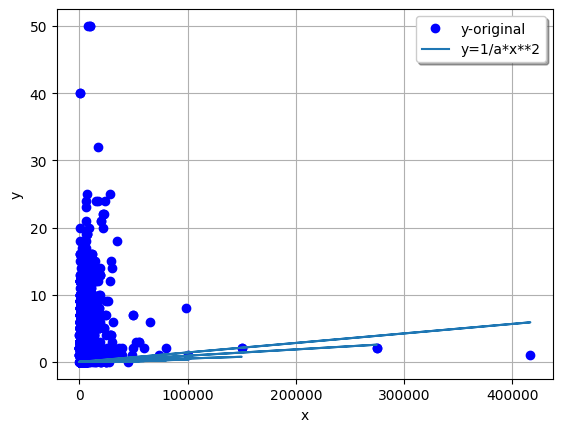

In [86]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=1/a*x**2")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [87]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

-1.1590617671902357

al tener una r negativa el modelo no fue el adecuado

funcion cuadratica

In [88]:
def  func1 (x, a, b, c):
     return a*x**2 + b*x + c

In [89]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, mexicolimpio1['price'], mexicolimpio1['beds'])
parametros

array([-6.83292638e-10,  2.35904128e-04,  1.56012454e+00])

In [90]:
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, mexicolimpio1['price'], mexicolimpio1['beds'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a*x**2 + b*x + c
yfit1

,price
0,1.947973
1,2.415073
2,5.585012
3,1.751698
4,2.011241
...,...
26531,3.369866
26532,1.907298
26533,1.780332
26534,1.740896


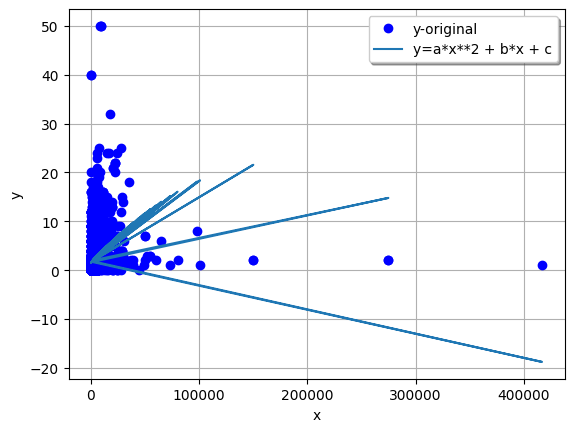

In [91]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=a*x**2 + b*x + c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [92]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

0.09862628031328646

al ser 0 el modelo no tiene ninguna capacidad predictiva y simplemente predice el promedio de los valores observados.

modelo 4 exponencial inversa 

In [93]:
def func2(x, a, b, c):
    return a /np.exp(b * x) + c

In [97]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, mexicolimpio1['price'], mexicolimpio1['beds'])
parametros



array([-6.83292638e-10,  2.35904128e-04,  1.56012454e+00])

In [98]:
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, mexicolimpio1['beds'], mexicolimpio1['price'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a /np.exp(b * x) + c
yfit1

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: overflow encountered in exp
  result = func(self.values, **kwargs)


,price
0,566.620054
1,566.620054
2,566.620054
3,566.620054
4,566.620054
...,...
26531,566.620054
26532,566.620054
26533,566.620054
26534,566.620054


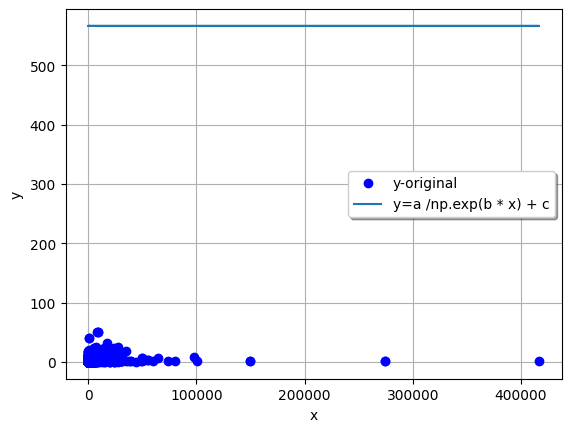

In [99]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=a /np.exp(b * x) + c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [100]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

-102921.36562089017

al ser negativo el modelo no sirve para el analisis pero se utilizo la exponencial inversa ya que decrese la grafica 

acomodates 

str to float 

In [35]:
mexicolimpio1['accommodates'] = pd.to_numeric(mexicolimpio1['accommodates'], errors='coerce')

In [101]:
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= mexicolimpio1[['accommodates']]
Var_Dep= mexicolimpio1['price']
#Redefinimos las variables 
x= Vars_Indep
y= Var_Dep

funcion 1 inversa 

In [102]:
def  func1 (x, a, b, c):
     return 1/a*x**2

In [105]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, mexicolimpio1['accommodates'], mexicolimpio1['price'])
parametros


/var/folders/6c/rr21_80s11n3cvrghbnb5mz00000gn/T/ipykernel_3919/3570044098.py:2: OptimizeWarning: Covariance of the parameters could not be estimated
  parametros, covs= curve_fit(func1, mexicolimpio1['accommodates'], mexicolimpio1['price'])


array([0.02511827, 1.        , 1.        ])

In [104]:
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, mexicolimpio1['accommodates'], mexicolimpio1['price'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = 1/a*x**2
yfit1

/var/folders/6c/rr21_80s11n3cvrghbnb5mz00000gn/T/ipykernel_3919/1406031813.py:2: OptimizeWarning: Covariance of the parameters could not be estimated
  parametros, _ = curve_fit(func1, mexicolimpio1['accommodates'], mexicolimpio1['price'])


,accommodates
0,159.246660
1,159.246660
2,7803.086329
3,636.986639
4,636.986639
...,...
26531,10191.786226
26532,358.304985
26533,358.304985
26534,636.986639


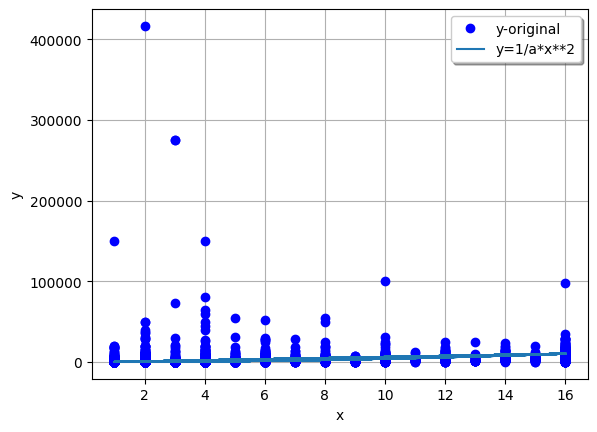

In [106]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=1/a*x**2")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [40]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

-0.008938803216491875

al ser una r2 negativo y 0 no sirve para el analisis

funcion 2 con valor absoluto

In [107]:
def  func1 (x, a, b, c):
     return a*np.abs(x)+b*x+c

In [109]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, mexicolimpio1['accommodates'], mexicolimpio1['price'])
parametros
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, mexicolimpio1['accommodates'], mexicolimpio1['price'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a*np.abs(x)+b*x+c
yfit1


,accommodates
0,1019.244229
1,1019.244229
2,5185.093238
3,1713.552397
4,1713.552397
...,...
26531,5879.401407
26532,1366.398313
26533,1366.398313
26534,1713.552397


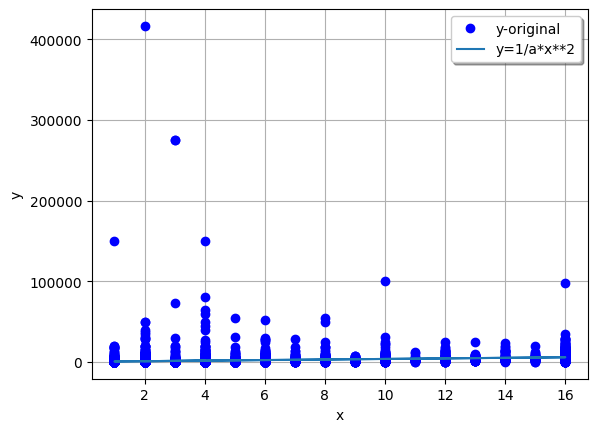

In [43]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=1/a*x**2")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [44]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

0.03406011523593078

funcion polinomial inversa 

In [45]:
def  func1 (x, a, b, c):
     return a/b*x**2+c*x

In [111]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, mexicolimpio1['accommodates'], mexicolimpio1['price'])
parametros
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, mexicolimpio1['accommodates'], mexicolimpio1['price'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a/b*x**2+c*x
yfit1


,accommodates
0,649.559148
1,649.559148
2,4533.769117
3,1298.492347
4,1298.492347
...,...
26531,5178.946625
26532,974.103991
26533,974.103991
26534,1298.492347


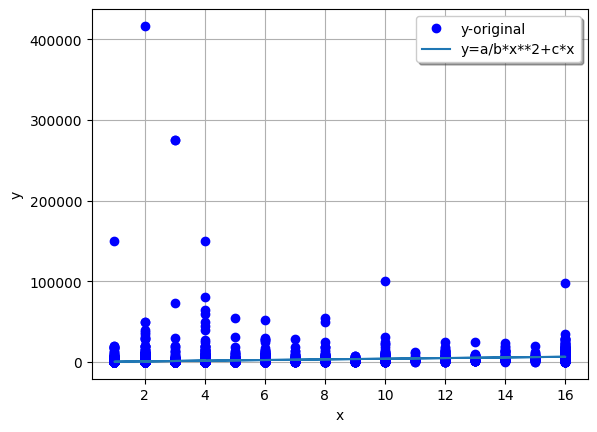

In [47]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=a/b*x**2+c*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [112]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

0.025625003669090596

al ser una r2 0 no sirve para el analisis

host_total_listings_count

In [113]:
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= mexicolimpio1['host_total_listings_count']
Var_Dep= mexicolimpio1['price']
#Redefinimos las variables 
x= Vars_Indep
y= Var_Dep

modelo 1 funcion tangencial

In [114]:
def  func1 (x, a, b, c):
     return a*np.tan(x)+b

In [116]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, mexicolimpio1['host_total_listings_count'], mexicolimpio1['price'])
parametros
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, mexicolimpio1['host_total_listings_count'], mexicolimpio1['price'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a*np.tan(x)+b
yfit1


/var/folders/6c/rr21_80s11n3cvrghbnb5mz00000gn/T/ipykernel_3919/1262160000.py:2: OptimizeWarning: Covariance of the parameters could not be estimated
  parametros, covs= curve_fit(func1, mexicolimpio1['host_total_listings_count'], mexicolimpio1['price'])
/var/folders/6c/rr21_80s11n3cvrghbnb5mz00000gn/T/ipykernel_3919/1262160000.py:5: OptimizeWarning: Covariance of the parameters could not be estimated
  parametros, _ = curve_fit(func1, mexicolimpio1['host_total_listings_count'], mexicolimpio1['price'])


0        1487.646543
1        1488.966706
2        1490.349786
3        1488.681315
4        1488.681315
            ...     
26531    1487.243022
26532    1488.499380
26533    1487.243022
26534    1487.752575
26535    1505.789399
Name: host_total_listings_count, Length: 26536, dtype: float64

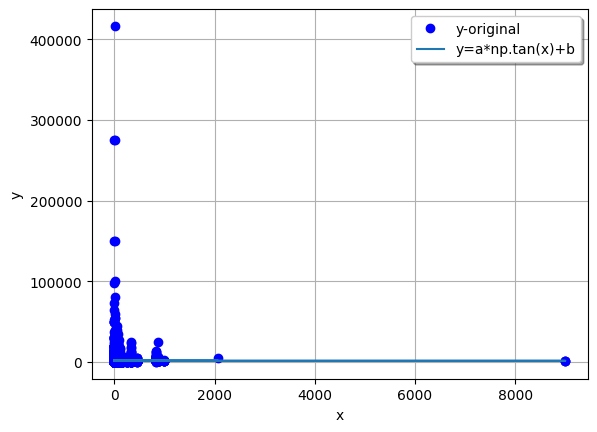

In [117]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=a*np.tan(x)+b")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [118]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

2.326721419354527e-05

Función lineal con producto de coeficientes

In [54]:
def  func1 (x, a, b, c):
     return a*x + b*x + c*x

In [121]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, mexicolimpio1['host_total_listings_count'], mexicolimpio1['price'])
parametros
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, mexicolimpio1['host_total_listings_count'], mexicolimpio1['price'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a*x + b*x + c*x
yfit1


/var/folders/6c/rr21_80s11n3cvrghbnb5mz00000gn/T/ipykernel_3919/2744013332.py:2: OptimizeWarning: Covariance of the parameters could not be estimated
  parametros, covs= curve_fit(func1, mexicolimpio1['host_total_listings_count'], mexicolimpio1['price'])
/var/folders/6c/rr21_80s11n3cvrghbnb5mz00000gn/T/ipykernel_3919/2744013332.py:5: OptimizeWarning: Covariance of the parameters could not be estimated
  parametros, _ = curve_fit(func1, mexicolimpio1['host_total_listings_count'], mexicolimpio1['price'])


0          8937.411584
1          1489.568597
2         25322.666156
3          5958.274390
4          5958.274390
             ...      
26531     22343.528961
26532     75967.998467
26533     22343.528961
26534      4468.705792
26535    381329.560934
Name: host_total_listings_count, Length: 26536, dtype: float64

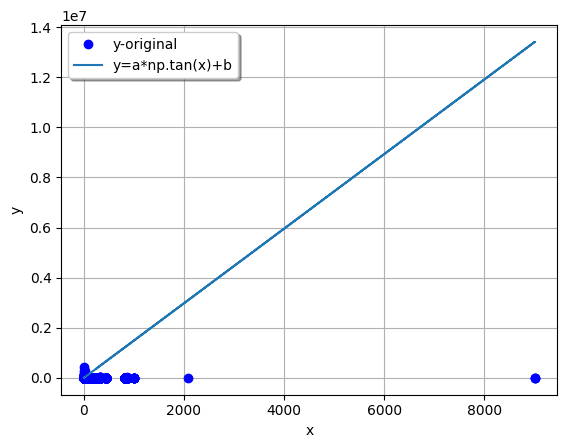

In [122]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=a*np.tan(x)+b")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [123]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

-2736.7805601504956

al ser negativo esta funcion no serviria para analisis

host_response_rate

In [124]:
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= mexicolimpio1['host_response_rate']
Var_Dep= mexicolimpio1['price']
#Redefinimos las variables 
x= Vars_Indep
y= Var_Dep

Función cociente entre polinomios

In [125]:
def  func1 (x, a, b, c):
     return (a*x**2 + b)/ c*x

In [127]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, mexicolimpio1['host_response_rate'], mexicolimpio1['price'])
parametros
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, mexicolimpio1['host_response_rate'], mexicolimpio1['price'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = (a*x**2 + b)/ c*x
yfit1


0        1459.683579
1           0.000000
2        1459.683579
3        1459.683579
4        1656.229711
            ...     
26531    1459.683579
26532    1526.534645
26533    1459.683579
26534    1459.683579
26535    1459.683579
Name: host_response_rate, Length: 26536, dtype: float64

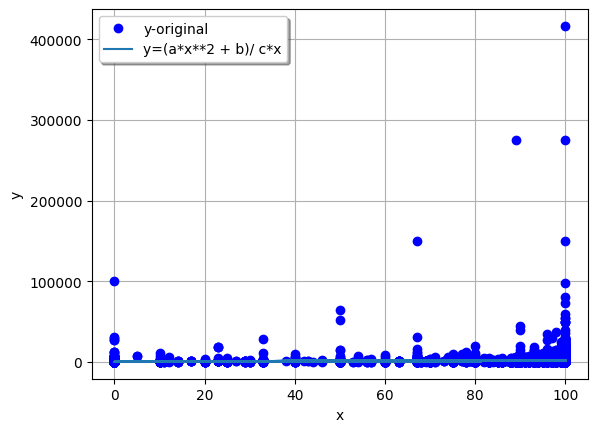

In [128]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=(a*x**2 + b)/ c*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [129]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

-0.0034214126288183433

al ser una r2 negativa no funciona para el analisis

Función inversa

In [135]:
def  func1 (x, a, b, c):
     return 1/a*x 

In [140]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, mexicolimpio1['host_response_rate'], mexicolimpio1['price'])
parametros
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, mexicolimpio1['host_response_rate'], mexicolimpio1['price'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = 1/a*x
yfit1


/var/folders/6c/rr21_80s11n3cvrghbnb5mz00000gn/T/ipykernel_3919/1721517864.py:2: OptimizeWarning: Covariance of the parameters could not be estimated
  parametros, covs= curve_fit(func1, mexicolimpio1['host_response_rate'], mexicolimpio1['price'])
/var/folders/6c/rr21_80s11n3cvrghbnb5mz00000gn/T/ipykernel_3919/1721517864.py:5: OptimizeWarning: Covariance of the parameters could not be estimated
  parametros, _ = curve_fit(func1, mexicolimpio1['host_response_rate'], mexicolimpio1['price'])


0        1511.278035
1           0.000000
2        1511.278035
3        1511.278035
4        1345.037451
            ...     
26531    1511.278035
26532    1465.939694
26533    1511.278035
26534    1511.278035
26535    1511.278035
Name: host_response_rate, Length: 26536, dtype: float64

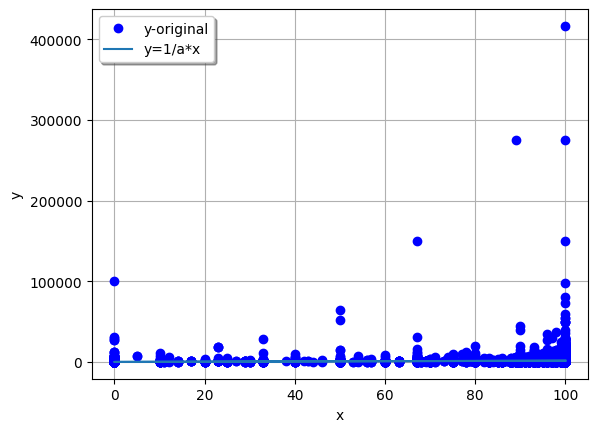

In [137]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=1/a*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [138]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

-0.0048631448223883655

host_acceptance_rate

In [65]:
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= mexicolimpio1['host_acceptance_rate']
Var_Dep= mexicolimpio1['price']
#Redefinimos las variables 
x= Vars_Indep
y= Var_Dep

funcion cociente entre polinomios

In [141]:
def  func1 (x, a, b, c):
     return (a*x**2 + b)/ c*x

In [143]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, mexicolimpio1['host_acceptance_rate'], mexicolimpio1['price'])
parametros
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, mexicolimpio1['host_acceptance_rate'], mexicolimpio1['price'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = (a*x**2 + b)/ c*x
yfit1


0        1498.179523
1           0.000000
2        1498.179523
3        1498.179523
4        1567.552749
            ...     
26531    1498.179523
26532    1525.786488
26533    1498.179523
26534    1498.179523
26535    1498.179523
Name: host_response_rate, Length: 26536, dtype: float64

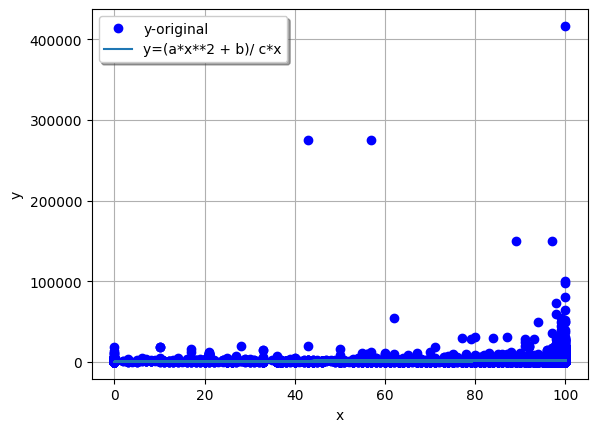

In [68]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=(a*x**2 + b)/ c*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [144]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

-0.003612820468456679

al ser negativa no funciona para el analisis

funcion 2  (Función cuadrática inversa)

In [70]:
def  func1 (x, a, b, c):
     return 1/a*x**2

In [146]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, mexicolimpio1['host_acceptance_rate'], mexicolimpio1['price'])
parametros
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, mexicolimpio1['host_acceptance_rate'], mexicolimpio1['price'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = 1/a*x**2
yfit1


0       -36536.983600
1           -0.000000
2       -36536.983600
3       -36536.983600
4       -28940.944709
             ...     
26531   -36536.983600
26532   -34377.647869
26533   -36536.983600
26534   -36536.983600
26535   -36536.983600
Name: host_response_rate, Length: 26536, dtype: float64

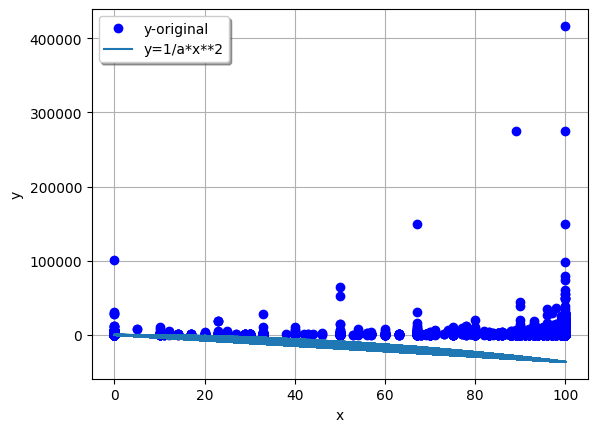

In [147]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=1/a*x**2")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [148]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

-67.1035813079166

al ser negativa no funciona para el analisis